In [1]:
import lsst.daf.persistence as dafPersist
import matplotlib.pyplot as plt
import numpy as np

import lsst.afw.table as afwTable
import lsst.afw.geom as afwGeom
import Utils.DiaSourceTools as DSTools
from astropy.time import Time

import lsst.afw.display.ds9 as ds9

import re

In [2]:
DATADIR="/datadec/cppm/jpreyes/CFHT_Complete"
directory = DATADIR+"/detect_testSN_2/"
butler = dafPersist.Butler(directory) 
filter = 'r'

In [3]:
patches = []
patches_file=open(DATADIR+"/patches.txt", "rb")
for line in patches_file:
    line = line.replace('\n','')
    text = re.split("=| ",line)
    patches.append(text[-1])
patches_file.close()

dates = []
days_file=open(DATADIR+"/days.txt", "rb")

for day in days_file:
    day = day.replace('\n','')
    dates.append(day)

days_file.close()

In [4]:
dates = ["2006-03-05"]

In [5]:

def get_light_curves_per_patch(butler, filter, dates, patch):

    multi_matches = None
    results = []
    stack_lcs = []
    for date in dates:
        t = Time(date)
        date_catalog = None
        #print date
        if butler.datasetExists("dayDiff_class_diaSrc", dataId={"filter":filter,"tract":0, "patch":patch, 'date':date}):
            date_catalog = butler.get("dayDiff_class_diaSrc", dataId={"filter":filter,"tract":0, "patch":patch, 'date':date})
            if multi_matches is None:
                multi_matches= afwTable.MultiMatch(date_catalog.schema, {'mjd':int}, radius=afwGeom.Angle(1./3600., afwGeom.degrees))
            multi_matches.add(date_catalog, {'mjd':int(t.mjd)})


    if multi_matches is not None:
        results = multi_matches.finish(removeAmbiguous=False)
        lcs = DSTools.get_light_curves_from_multimatch_results2(results)
        t_lcs = DSTools.threshold_light_curves(lcs, 1)
        for t_lc in t_lcs:
            stack_lcs.append(DSTools.build_lightcurve4(t_lc, "base_CircularApertureFlux_4_5_flux", filter))
            
    return patch, stack_lcs

def function(args):
    return get_light_curves_per_patch(*args)

In [6]:
results = function([butler, filter, dates, '20,20'])

In [7]:
from multiprocessing import Pool
from functools import partial
reload(DSTools)

<module 'Utils.DiaSourceTools' from 'Utils/DiaSourceTools.pyc'>

In [8]:
p = Pool(100)



params = [(butler, 'r', dates, patch) for patch in patches]
params2 = [(butler, 'g', dates, patch) for patch in patches]
params3 = [(butler, 'i', dates, patch) for patch in patches]

#butler_z = dafPersist.Butler("/datadec/cppm/jpreyes/CFHT_filter_z/detect_testSN_6") 
params4 = [(butler, 'z', dates, patch) for patch in patches]

params.extend(params2)
params.extend(params3)
params.extend(params4)
#print params
res = p.map(function, params)
#f = Pool(25).map(get_light_curves_per_patch, ([butler], ['g'], ['0,20'], [dates]))

In [9]:
res

[('0,5', []),
 ('0,6', []),
 ('0,7', []),
 ('0,8', []),
 ('0,9', []),
 ('0,10', []),
 ('0,11', []),
 ('0,12', []),
 ('0,13', []),
 ('0,14', []),
 ('0,15', []),
 ('0,16', []),
 ('0,17', []),
 ('0,18', []),
 ('0,19', []),
 ('0,20', []),
 ('0,21', []),
 ('0,22', []),
 ('0,23', []),
 ('0,24', []),
 ('0,25', []),
 ('1,5', []),
 ('1,6', []),
 ('1,7', []),
 ('1,8', []),
 ('1,9', []),
 ('1,10', []),
 ('1,11', []),
 ('1,12', []),
 ('1,13', []),
 ('1,14', []),
 ('1,15', []),
 ('1,16', []),
 ('1,17', []),
 ('1,18', []),
 ('1,19', []),
 ('1,20', []),
 ('1,21', []),
 ('1,22', []),
 ('1,23', []),
 ('1,24', []),
 ('1,25', []),
 ('2,5', []),
 ('2,6', []),
 ('2,7', []),
 ('2,8', []),
 ('2,9', []),
 ('2,10', []),
 ('2,11', []),
 ('2,12', []),
 ('2,13', []),
 ('2,14', []),
 ('2,15', []),
 ('2,16', []),
 ('2,17', []),
 ('2,18', []),
 ('2,19', []),
 ('2,20', []),
 ('2,21', []),
 ('2,22', []),
 ('2,23', []),
 ('2,24', []),
 ('2,25', []),
 ('3,5', []),
 ('3,6', []),
 ('3,7', []),
 ('3,8', []),
 ('3,9', []),


In [13]:
from astropy.table import Table, vstack
lcs = {}
for r in res:
    if len(r[1])>0:
        if lcs.has_key(r[0]):
            lcs[r[0]].extend(r[1])
        else:
            lcs[r[0]] = r[1]
        
lcs = lcs.values()
print len(lcs)

419


In [14]:
diffexp = butler.get("dayDiff_differenceExp", dataId={"filter":'z',"tract":0, "patch":'22,16', 'date':'2006-03-05'})
ds9.mtv(diffexp, frame=1)

In [15]:
print lcs[-1]
test = lcs[0]
print len(test)
t_f = build_multi_filter_lc(test)
print len(t_f)

[<Table length=1>
 mjd  classification zpsys       flux      ...     dec         zp   bandpass
int64    float64      str2     float64     ...    object    float64   str5  
----- -------------- ----- --------------- ... ------------ ------- --------
53799            4.0    ab -0.757845699787 ... 0.927549 rad    25.0    sdssr, <Table length=1>
 mjd  classification zpsys      flux      ...     dec        zp   bandpass
int64    float64      str2    float64     ...    object   float64   str5  
----- -------------- ----- -------------- ... ----------- ------- --------
53799            4.0    ab -16.1902332306 ... 0.92756 rad    25.0    sdssr, <Table length=1>
 mjd  classification zpsys      flux     ...     dec         zp   bandpass
int64    float64      str2    float64    ...    object    float64   str5  
----- -------------- ----- ------------- ... ------------ ------- --------
53799            4.0    ab 2.20549535751 ... 0.927556 rad    25.0    sdssr, <Table length=1>
 mjd  classification

In [ ]:
test = lcs[0]
import astropy.coordinates as coord
import astropy.units as u
for ls in test:
    c = coord.SkyCoord(ra=float(np.mean(ls['ra'])), dec=float(np.mean(ls['dec'])), unit=(u.rad))
    #print c.ra.deg, c.dec.deg
    wcs = diffexp.getWcs()
    pix = wcs.skyToPixel(afwGeom.Angle(c.ra.rad), afwGeom.Angle(c.dec.rad))
    #print pix
    if ls[0]["bandpass"]=="sdssz":
        ds9.dot('x',pix[0], pix[1], frame=1, size=10, ctype=ds9.RED)
    else:
        ds9.dot('x',pix[0], pix[1], frame=1)

In [11]:


def build_multi_filter_lc(lcs):
    final_lc = []
 
    for lc in lcs:
        added = False
        
        for i, f_lc in enumerate(final_lc):
            s1 = {'ra':np.mean(lc["ra"]), 'dec':np.mean(lc["dec"])}
            s2 = {'ra':np.mean(f_lc["ra"]), 'dec':np.mean(f_lc["dec"])}
      
            if DSTools.source_distance(s1,s2)<1:             
                added = True
                final_lc[i] = vstack([lc, f_lc])
                  #print final_lc[i]
        if added == False:
                  final_lc.append(lc)
                  
    return final_lc
        

In [12]:
p = Pool(100)
mf_lcs = p.map(build_multi_filter_lc, lcs)

In [17]:
tot_lcs = []
for p_lc in mf_lcs:
    tot_lcs.extend(p_lc)

In [18]:
len(tot_lcs)

95669

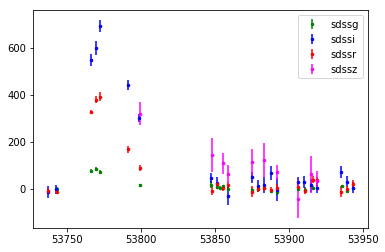

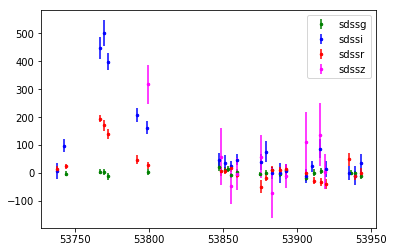

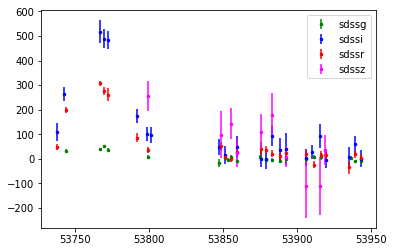

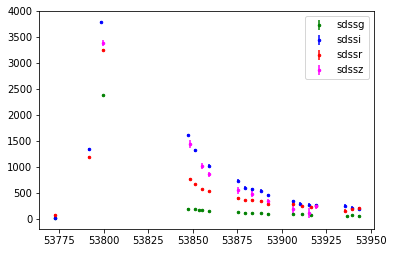

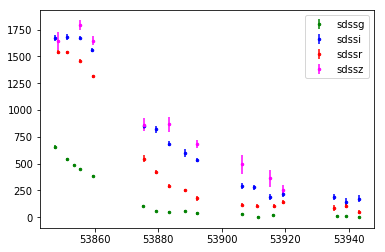

...

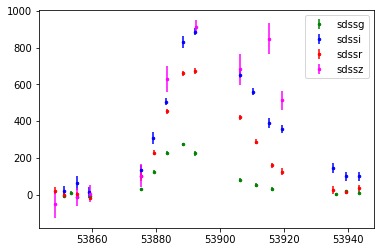

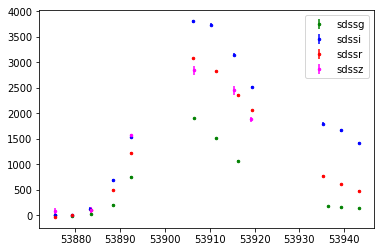

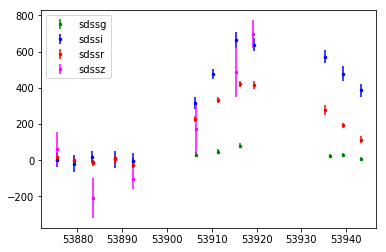

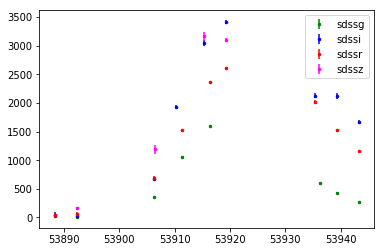

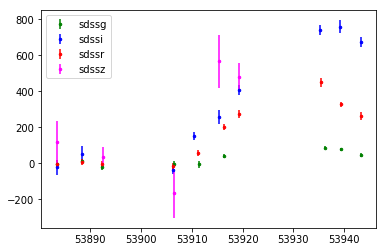

In [15]:
%matplotlib inline
import re
import astropy.coordinates as coord
import astropy.units as u


f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table9.dat.txt','r')
data_elems = f.read()
elems = re.findall('^(06D3.*?)\\|(.*?)\\|', data_elems, re.MULTILINE)

f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table10.dat.txt','r')
data = f.read()

snls_array = []
for sn in elems:
    c = coord.SkyCoord(sn[-1], unit=(u.hourangle, u.deg))
    
    m = re.findall('^'+str(sn[0])+'\\|(r|g|i|z)\\|(.*?)\\|(.*?)\\|(.*?)$', data, re.MULTILINE)

    snls_lc = DSTools.build_light_curve_from_snls_file(m, c)
    
    #print m
    #print sn[0], c.ra.deg, c.dec.deg
    
    #plt.errorbar(snls_lc['mjd'], snls_lc['flux'], yerr=snls_lc['flux_error'], fmt='.', color='blue')
    show_multi_filter_light_curve(snls_lc)
    plt.show()
    snls_array.append(snls_lc)
    

In [16]:
def match_with_lc(snls_array, stack_lc):
    matches = []
    for lc in snls_array:
        #print "light curve"
        val = {"ra":lc[0]["ra"], "dec":lc[0]["dec"]}
        #print np.rad2deg(lc[0]["ra"]), np.rad2deg(lc[0]["dec"])
        for i, slc in enumerate(stack_lc):

            comp = {"ra":np.mean(slc["ra"]), "dec":np.mean(slc["dec"])}
            if DSTools.source_distance(val, comp)<1:
                print i
                matches.append((lc,slc))


    print len(matches)
    return matches

In [17]:
stats = []
for lc in tot_lcs:
    t_by_filter = lc.group_by("bandpass")
    indices = t_by_filter.groups.indices
    stats.append(len(indices)-1)
    

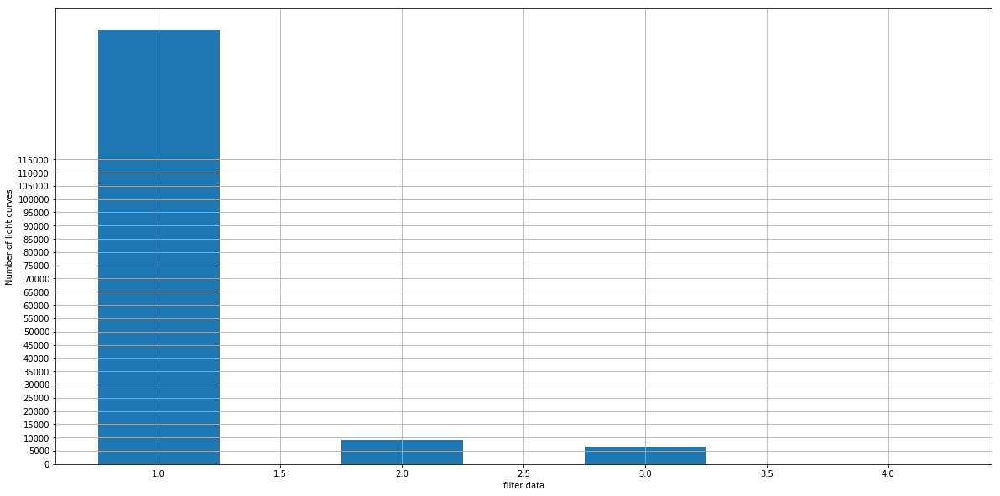

In [20]:
plt.figure(figsize=(20,10))
plt.hist(stats, bins=range(1,6,1), align='left', rwidth=0.5)
plt.ylabel("Number of light curves")
plt.xlabel("filter data")
plt.yticks(np.arange(0,120000,5000))
plt.grid(True)
plt.show()

In [19]:
matches_45= match_with_lc(snls_array, tot_lcs)

13839
129864
153536
5214
47577
110175
42736
79751
19028
124697
4231
4862
11491
67320
3172
69021
151678
151721
38497
114701
72304
88869
136271
25556
116993
92595
22712
154502
154682
174453
76704
40439
45535
71758
67050
35


In [14]:
def show_multi_filter_light_curve(t):
    colors = {"sdssg":"green", "sdssi":"blue", "sdssr":"red", "sdssz":"magenta"}
    t_by_filter = t.group_by("bandpass")

    indices = t_by_filter.groups.indices
    #print indices

    for i in range(0, len(indices)-1):

        data = t_by_filter[indices[i]:indices[i+1]]
        #print data
        plt.errorbar(data["mjd"], data["flux"],yerr=data["flux_error"], fmt='.', markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])
    plt.legend()
    #plt.show()

214.2919202 53.0247723995


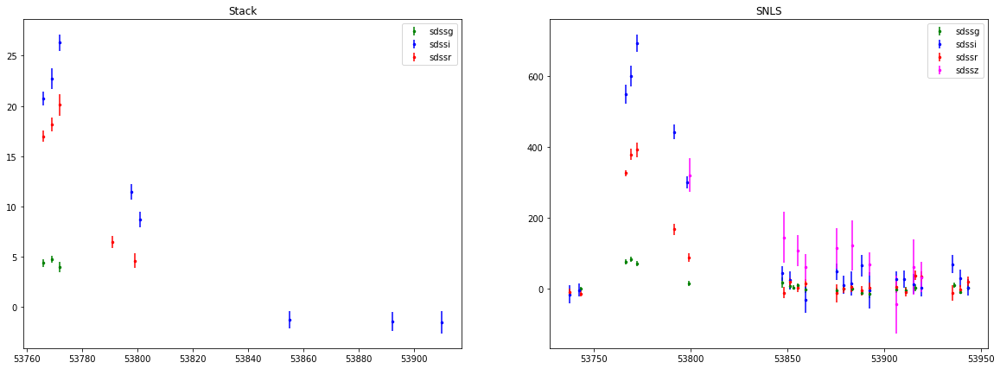

215.181501398 52.191088095


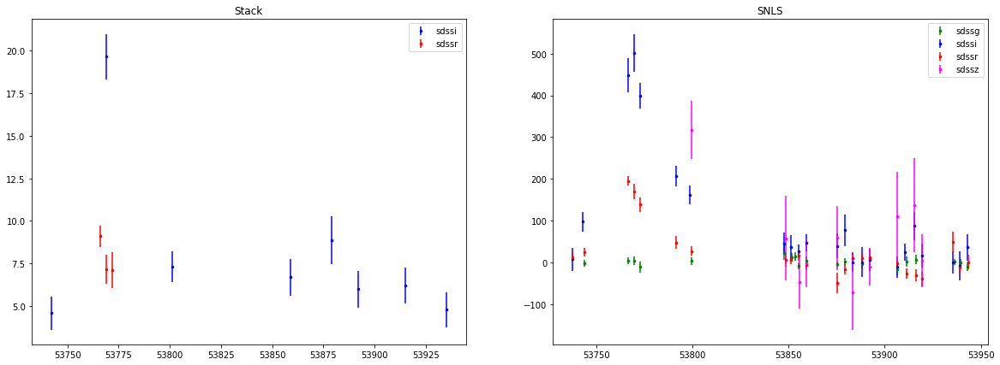

214.381746194 52.9124055775


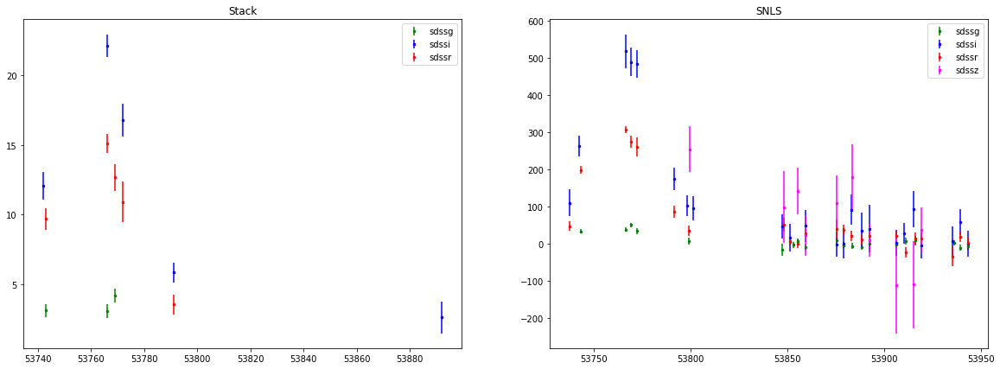

214.857632631 52.6410304186


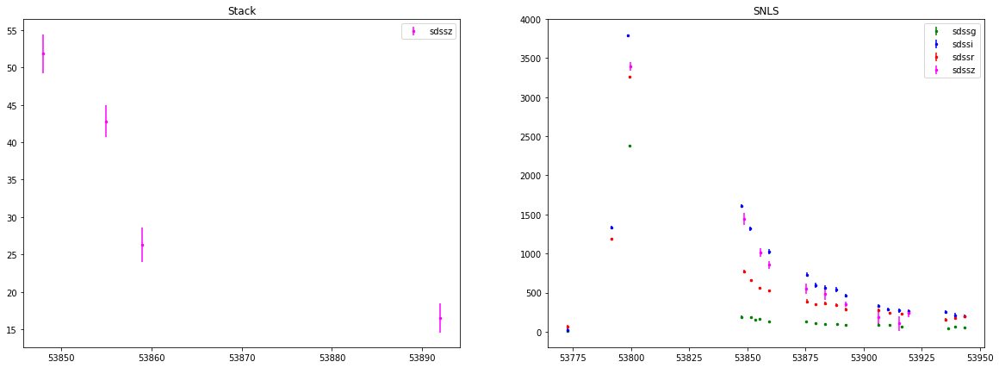

214.857593675 52.641031723


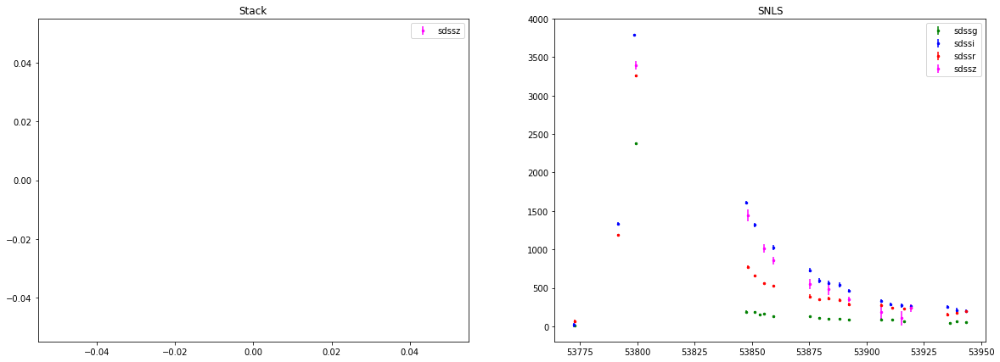

214.857609344 52.6410332754


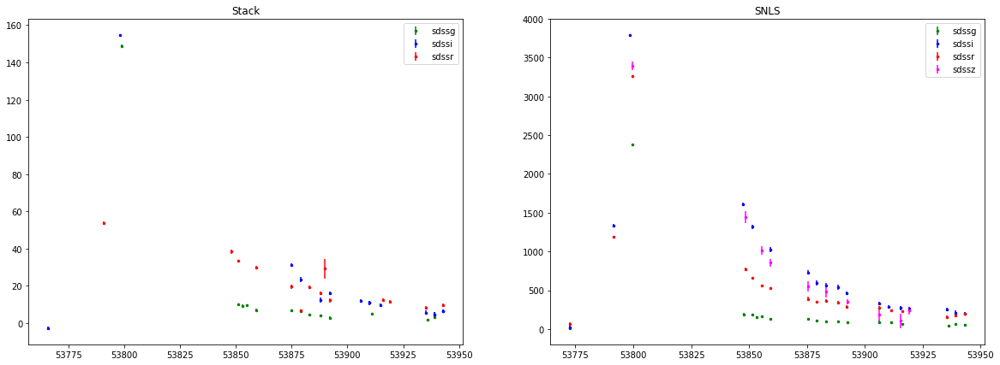

215.571895594 52.9576675523


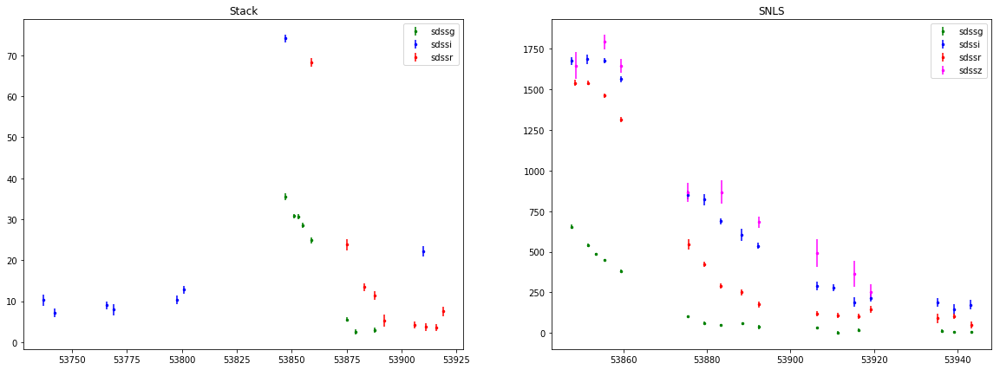

215.571910431 52.957623421


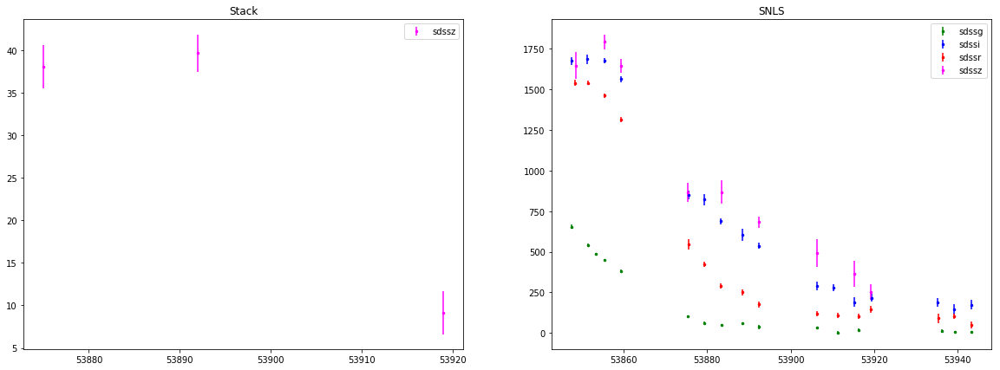

215.552318735 52.6408853403


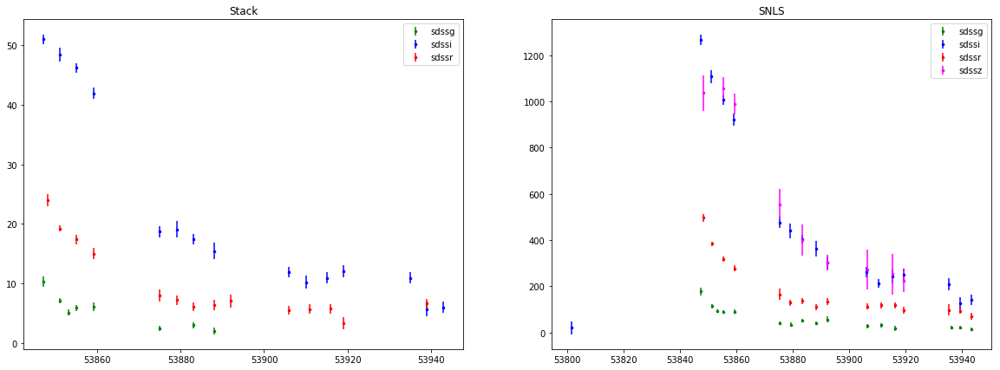

215.55230198 52.6409149355


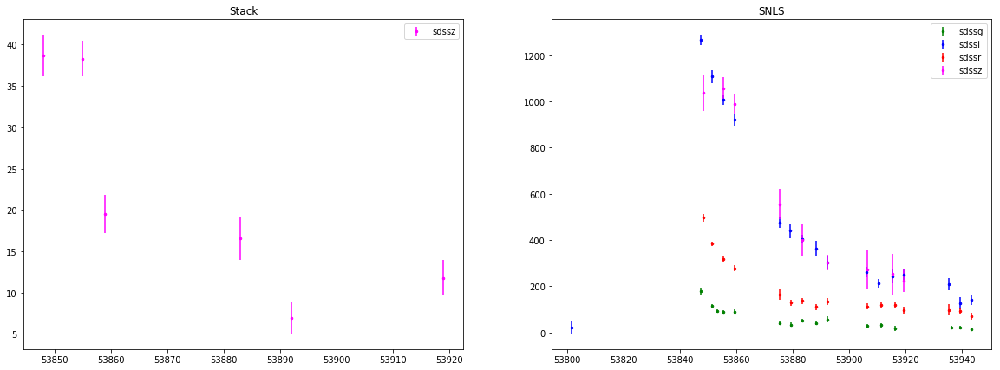

214.247335271 52.8824815571


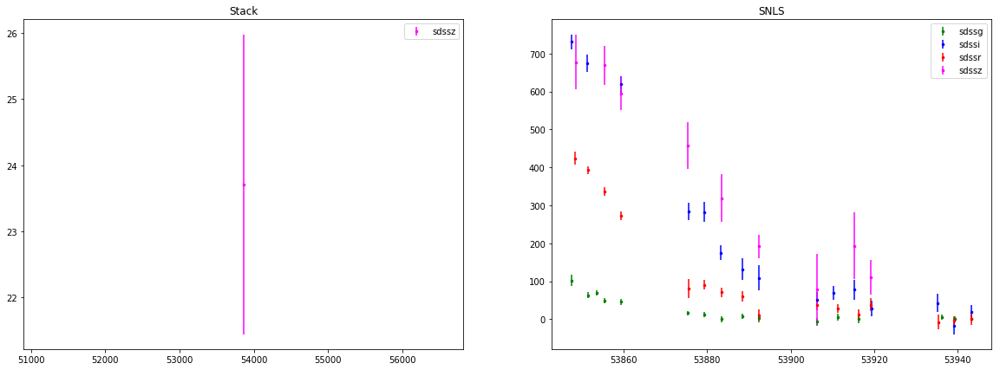

214.247564375 52.8824809737


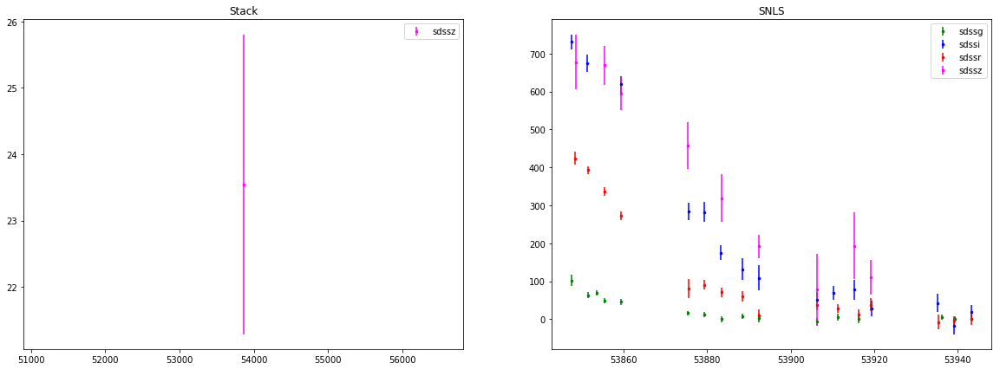

214.247565605 52.8824803117


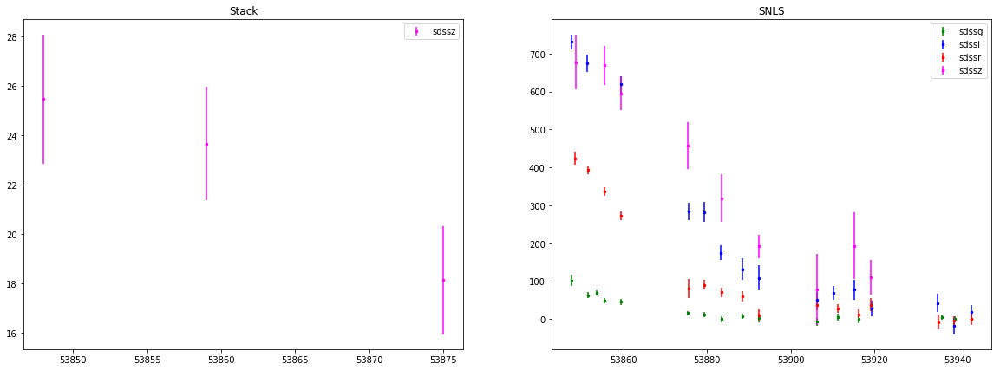

214.247543068 52.8824919298


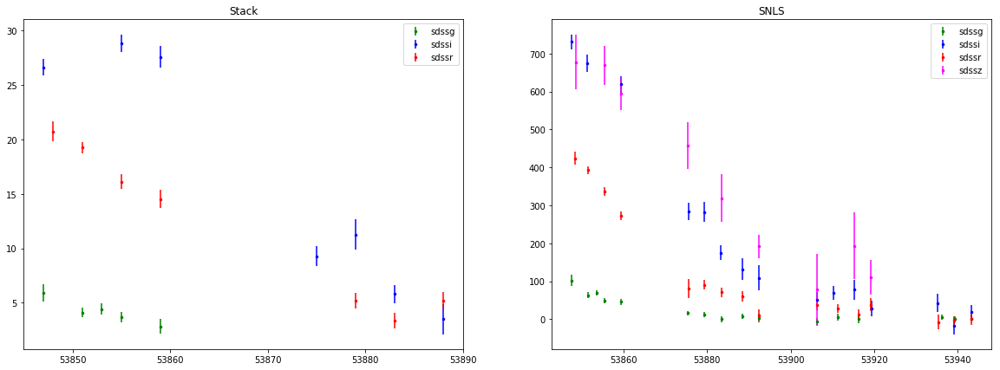

214.340082746 52.4526845002


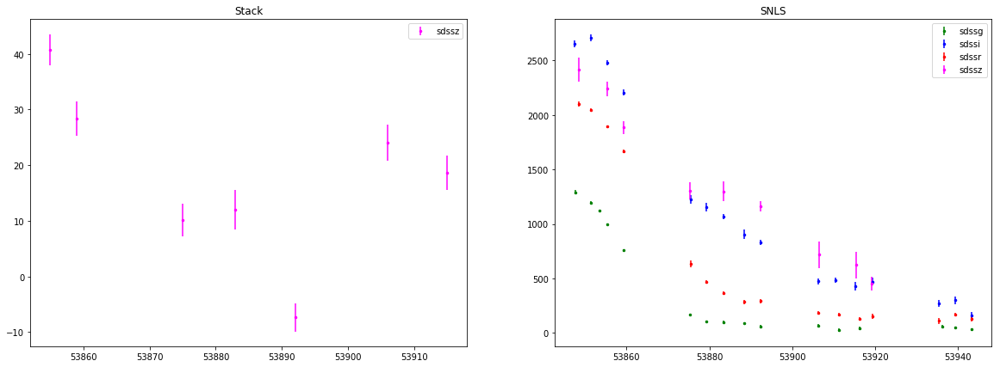

214.34011128 52.4527344172


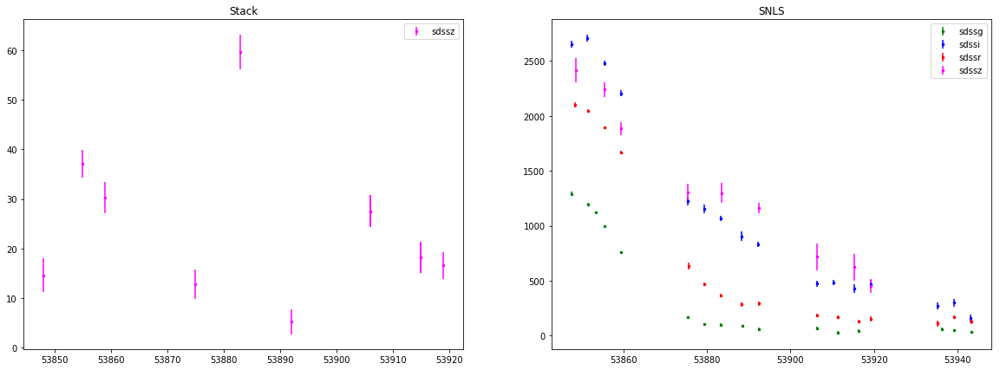

214.340181796 52.4528167448


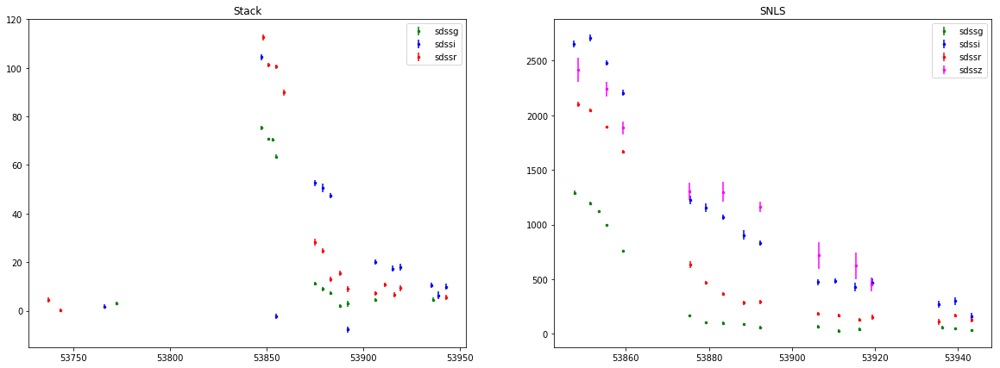

214.340237663 52.452742354


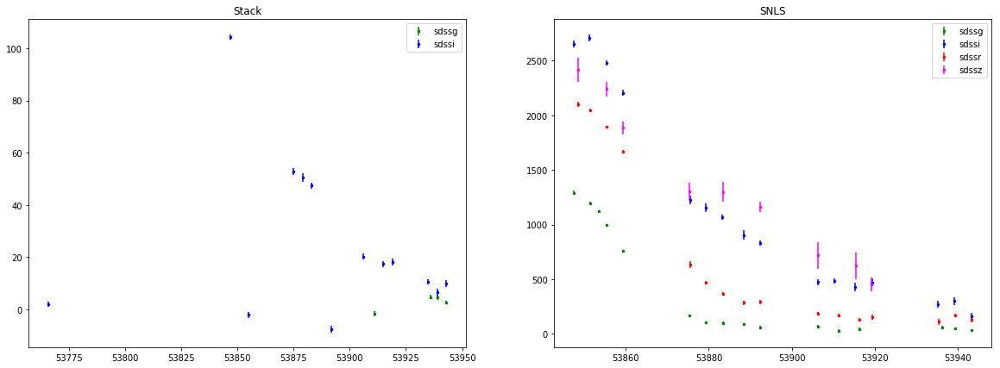

214.699253374 52.7564861874


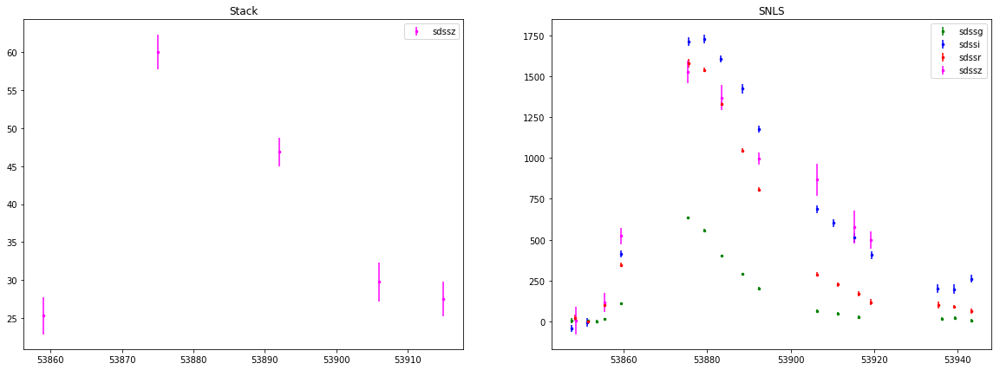

214.69926278 52.7565118438


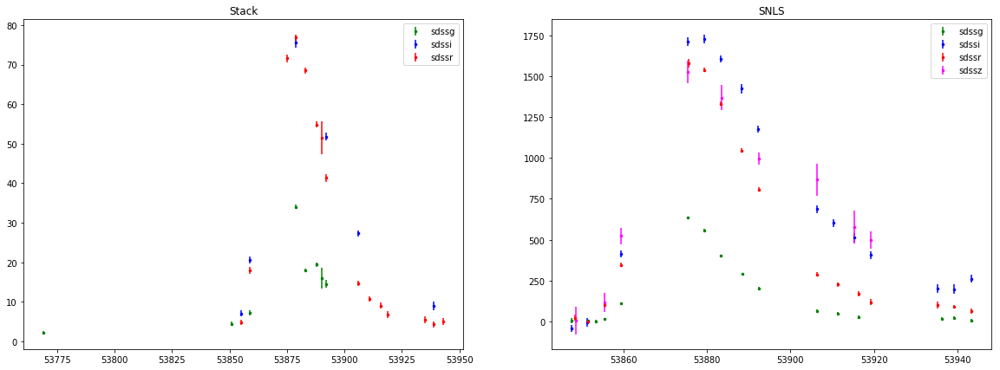

214.254440444 52.2324421001


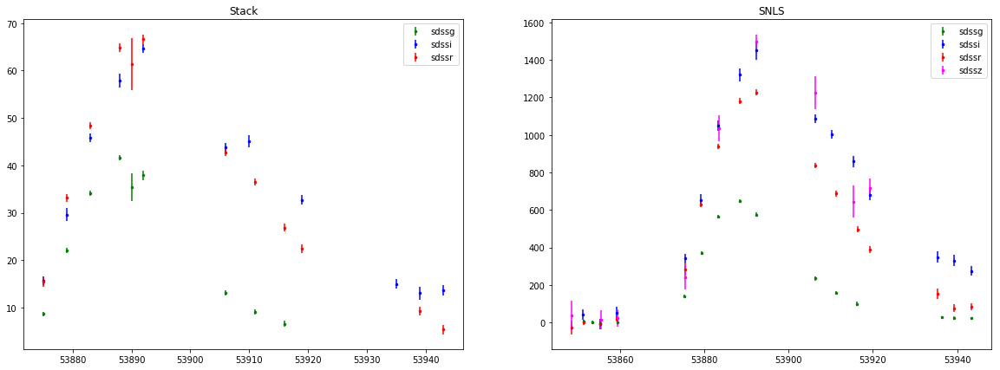

214.254486859 52.2324298901


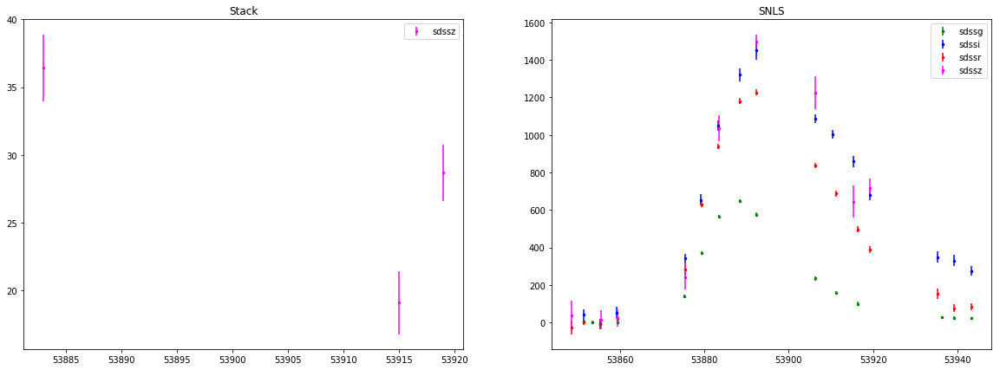

214.254281612 52.2324408118


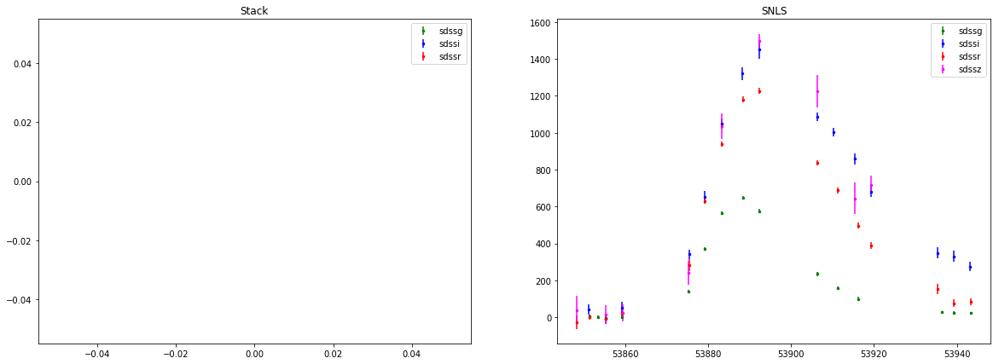

214.847641873 53.022968475


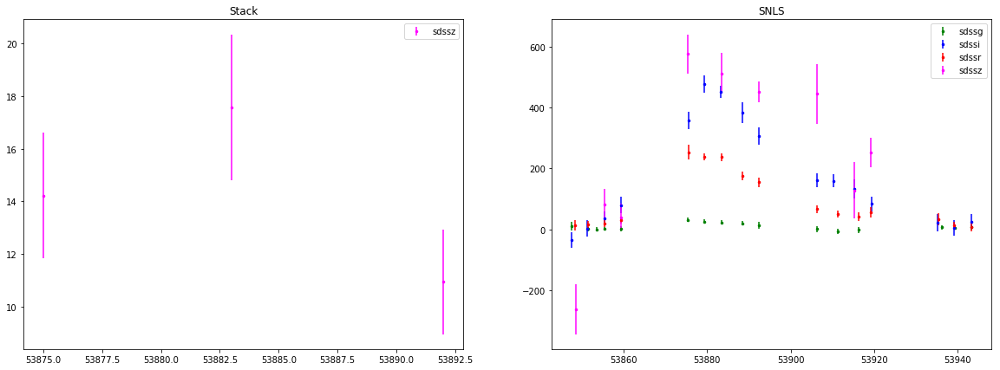

214.847683955 53.0229636408


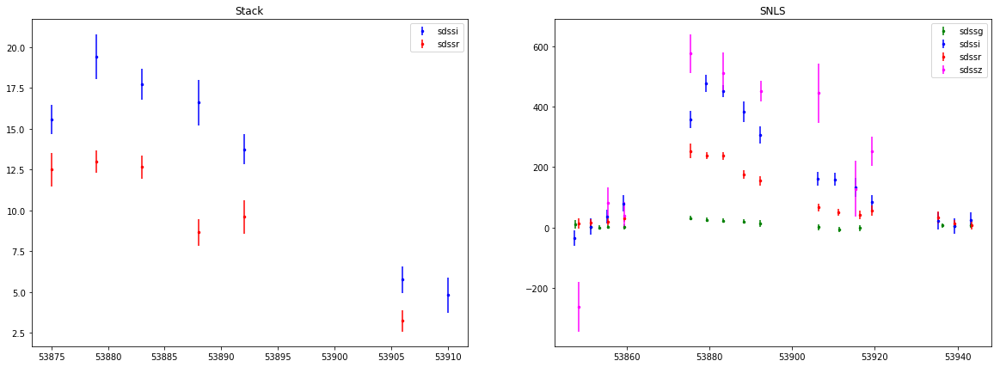

215.305530085 52.4561012023


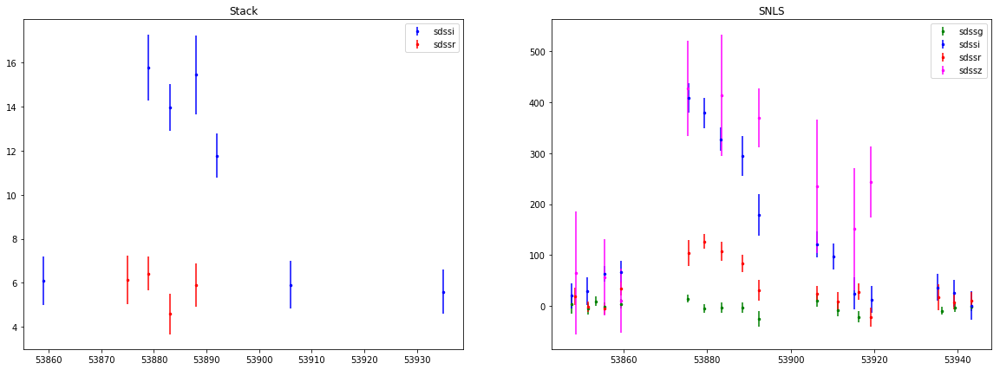

215.519746299 52.3384814365


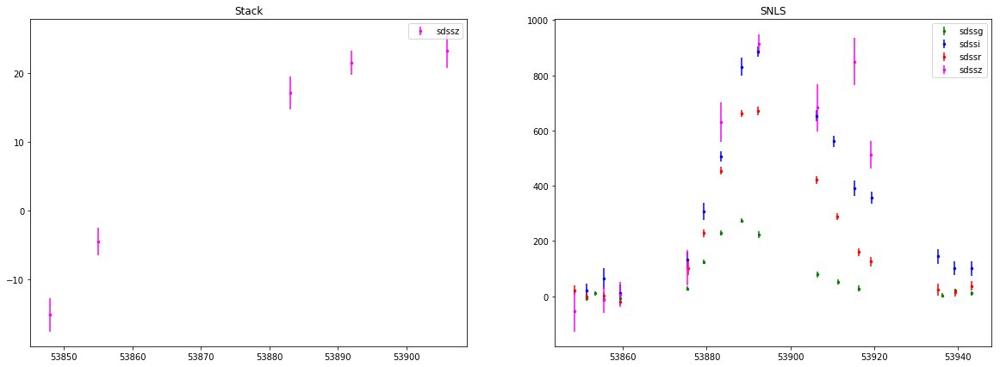

215.519728339 52.3384236886


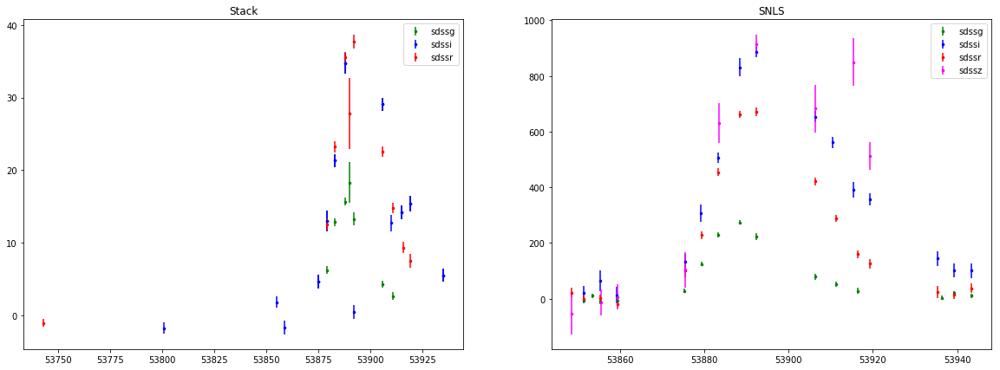

215.519690588 52.338407234


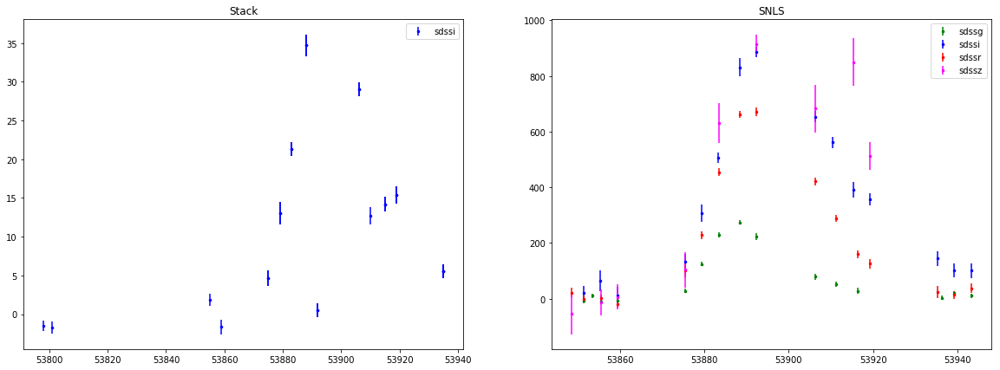

215.519631665 52.3384418287


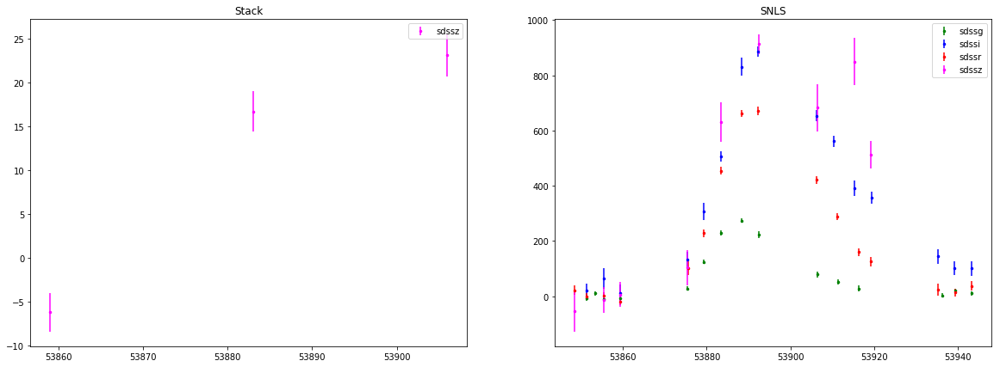

215.077576515 52.8971050998


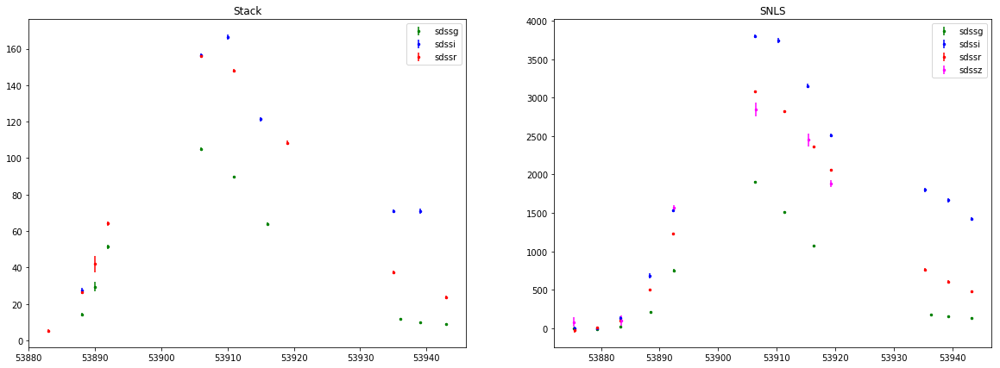

214.630804728 52.4429738166


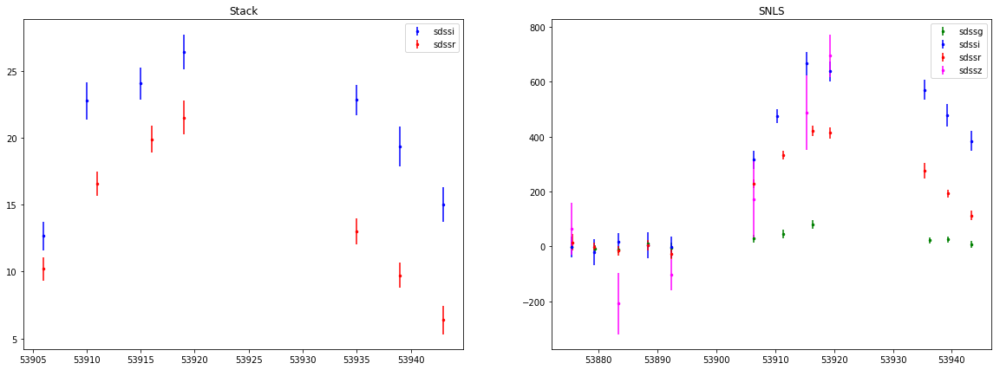

214.435768121 52.3612448443


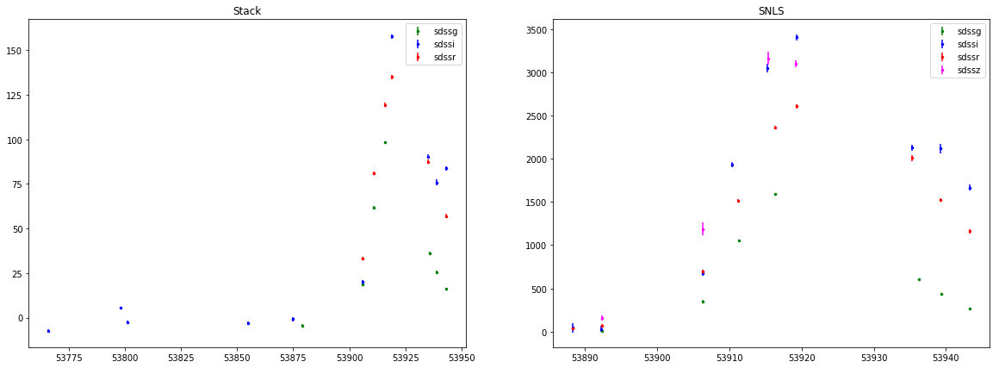

214.435703305 52.3611912417


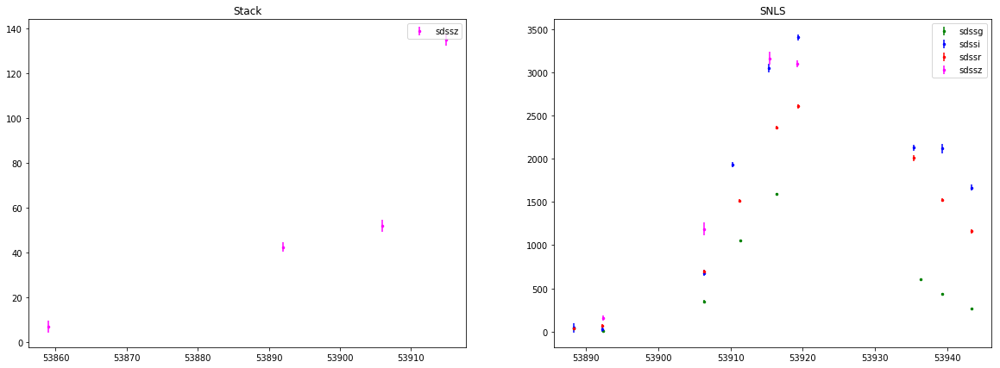

214.263527612 52.9361907548


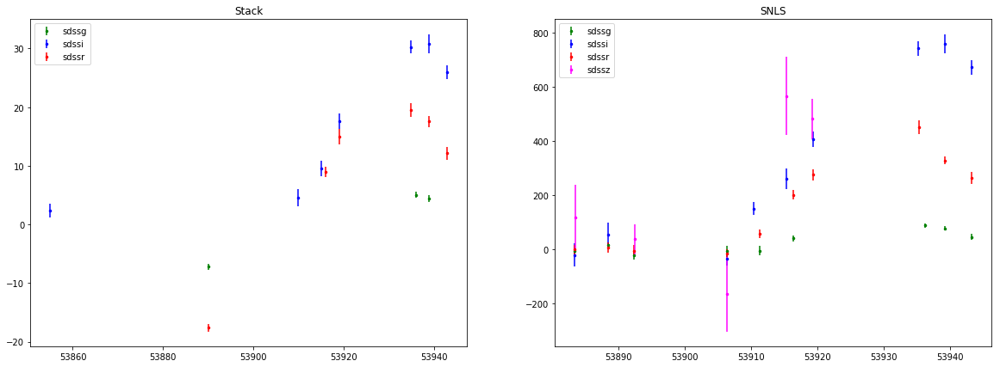

In [21]:
for match in matches_45:
    t = match[-1]
    

    plt.figure(figsize=(20,7))
    c = coord.SkyCoord(ra=float(np.mean(t['ra'])), dec=float(np.mean(t['dec'])), unit=(u.rad))
    print c.ra.deg, c.dec.deg
    
    plt.subplot(121)
    plt.title("Stack")
    show_multi_filter_light_curve(t)
    plt.subplot(122)
    plt.title("SNLS")
    show_multi_filter_light_curve(match[0])
    plt.show()
    #t_by_filter = t.group_by("bandpass")

    #indices = t_by_filter.groups.indices
    #print indices

    #for i in range(0, len(indices)-1):

    #    data = t_by_filter[indices[i]:indices[i+1]]
        #print data
    #    plt.errorbar(data["mjd"], data["flux"],yerr=data["flux_error"], fmt='.', markersize='5')
        
    #plt.show()
    #print "done"

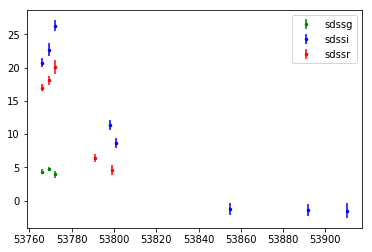

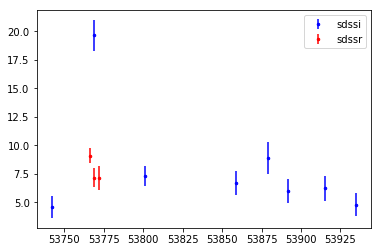

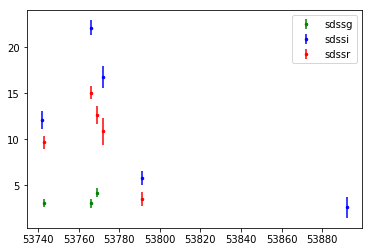

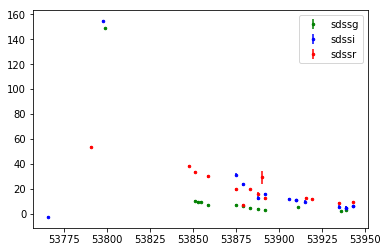

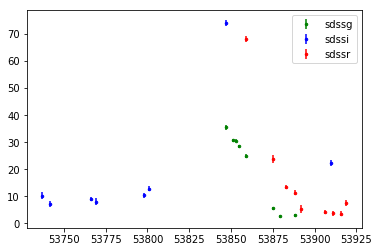

...

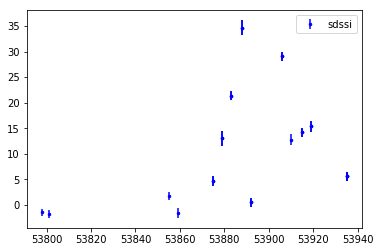

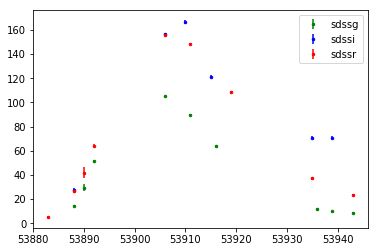

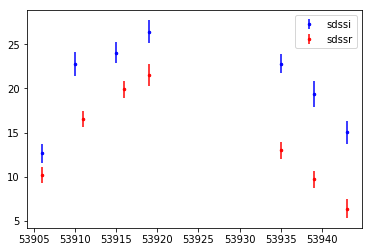

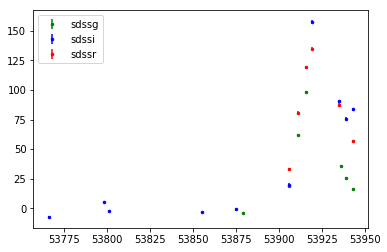

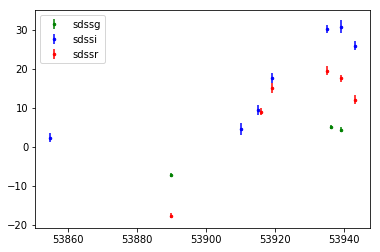

In [202]:

for match in matches_45:
    t = match[-1]

    t_by_filter = t.group_by("bandpass")

    indices = t_by_filter.groups.indices
    #print indices

    for i in range(0, len(indices)-1):

        data = t_by_filter[indices[i]:indices[i+1]]
        #print data
        plt.errorbar(data["mjd"], data["flux"],yerr=data["flux_error"], fmt='.', markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])
    plt.legend()
    plt.show()
    

mjd,classification,zpsys,flux,ra,flux_error,dec,zp,bandpass
int64,float64,str2,float64,object,float64,object,float64,str5
53766,4.0,ab,4.36973810196,3.7401 rad,0.414177775383,0.925457 rad,25.0,sdssg
53769,4.0,ab,4.76188850403,3.7401 rad,0.37085673213,0.925457 rad,25.0,sdssg
53772,4.0,ab,3.95565128326,3.7401 rad,0.50426441431,0.925457 rad,25.0,sdssg


In [19]:
def show_matches_2(matches):
    factors = []
    for match in matches:
        print len(match[-1])
        print np.rad2deg(match[0][0]['ra']), np.rad2deg(match[0][0]['dec'])
        lc_fluxes = match[0]["flux"]
        factor = max(match[-1]['flux']) / max(lc_fluxes)
        lc_fluxes = np.multiply(lc_fluxes, factor)
        lc_errors = np.multiply(match[0]["flux_error"], factor)
        
        factors.append(factor)
        plt.figure(figsize=(20,10))
        print match[-1]["flux"]
        plt.errorbar(match[-1]["mjd"], match[-1]["flux"],yerr=match[-1]["flux_error"], fmt='.', markersize='5')
        plt.errorbar(match[0]["mjd"], lc_fluxes, yerr=lc_errors, fmt='.', markersize='5')
        plt.show()

5
214.291841667 53.024825
     flux    
-------------
16.9819355011
18.1361579895
20.1127281189
6.46758079529
4.61362743378


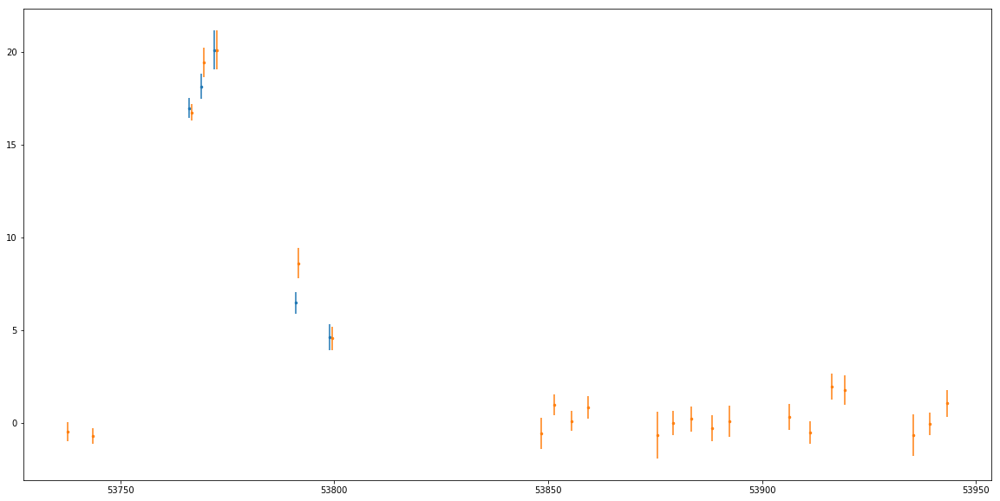

3
215.181558333 52.1910638889
     flux    
-------------
9.10048007965
7.17147922516
7.09033489227


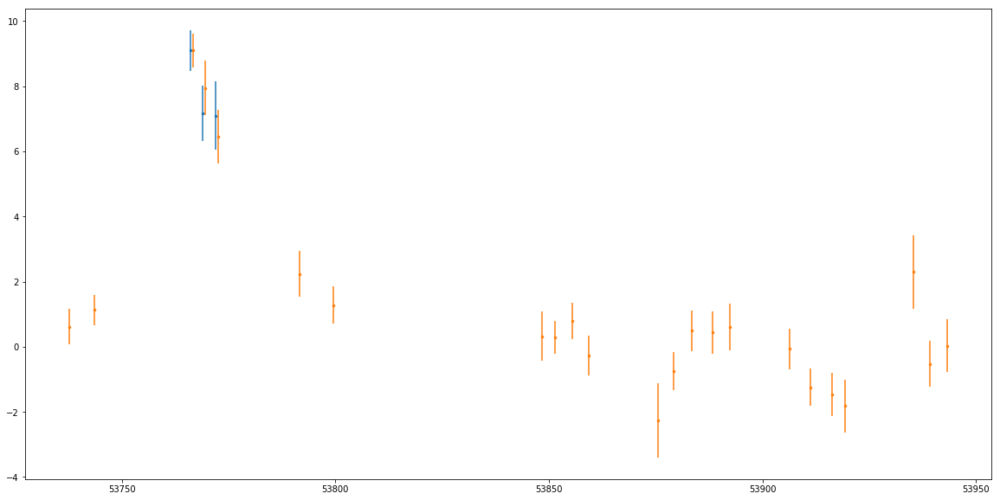

5
214.381666667 52.9124722222
     flux    
-------------
9.67005252838
15.0996847153
12.6638917923
10.9036073685
3.54094576836


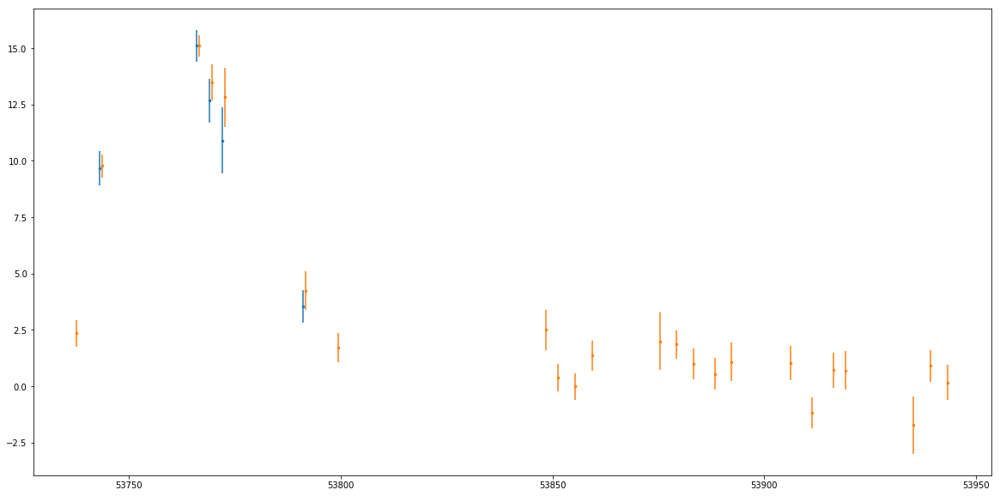

14
214.8577 52.6409833333
     flux    
-------------
 53.784324646
38.3537101746
33.5332069397
29.8163032532
19.5150775909
6.64919805527
19.4161205292
16.1132259369
29.2000045776
12.1627283096
12.3618459702
11.5692539215
8.34607982635
9.61227416992


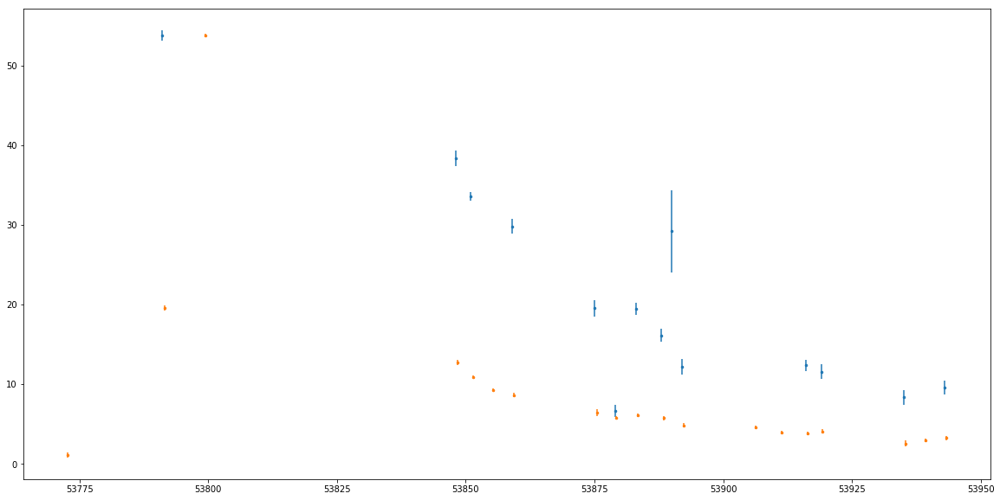

9
215.571704167 52.9576805556
     flux    
-------------
68.3162231445
23.7773151398
13.4268436432
 11.369392395
5.24255800247
4.13901758194
3.68424701691
3.54151391983
7.48824930191


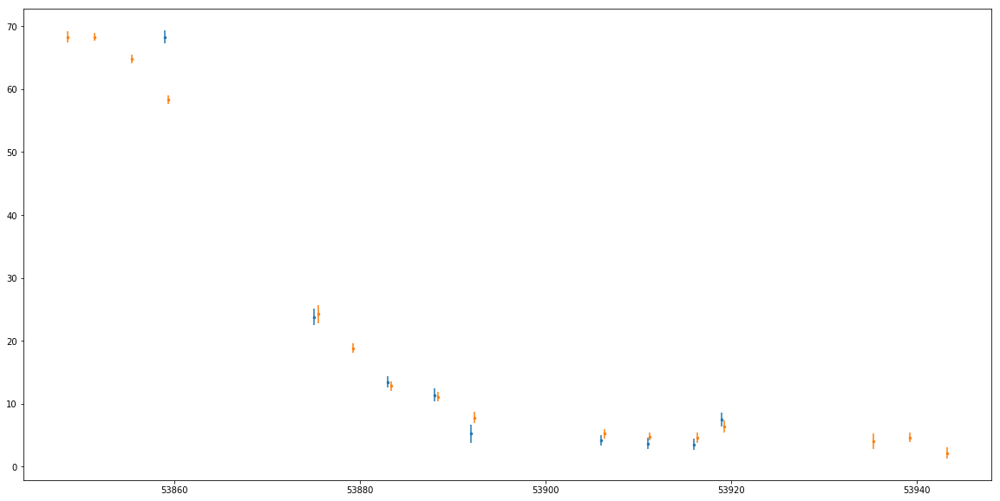

14
215.552404167 52.6408472222
     flux    
-------------
23.9813652039
19.2261619568
17.3691291809
15.0046272278
7.94257259369
7.19191837311
6.08988142014
6.38306093216
7.05037736893
5.48023223877
5.67065811157
5.75080442429
3.28315424919
6.62304782867


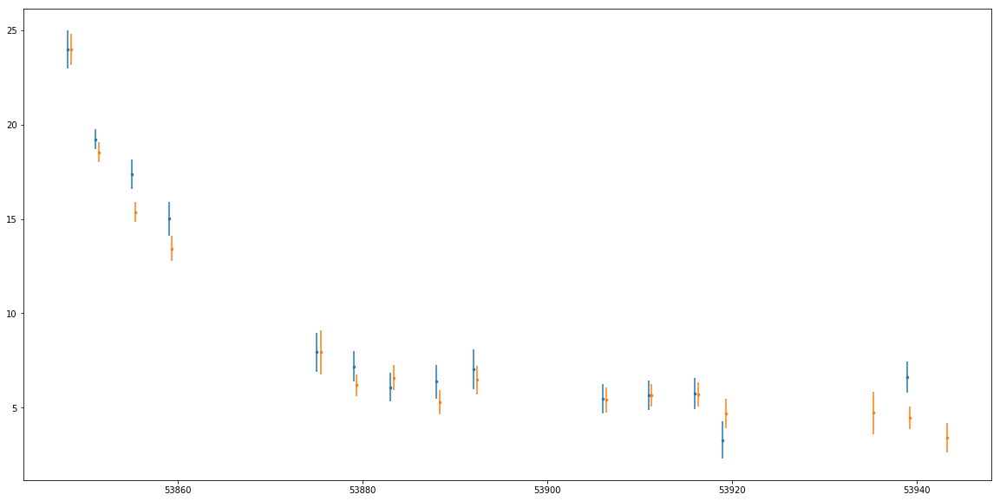

7
214.247466667 52.8825444444
     flux    
-------------
 20.742067337
19.2545013428
16.1061496735
14.5205373764
 5.1919875145
3.36089110374
5.21383905411


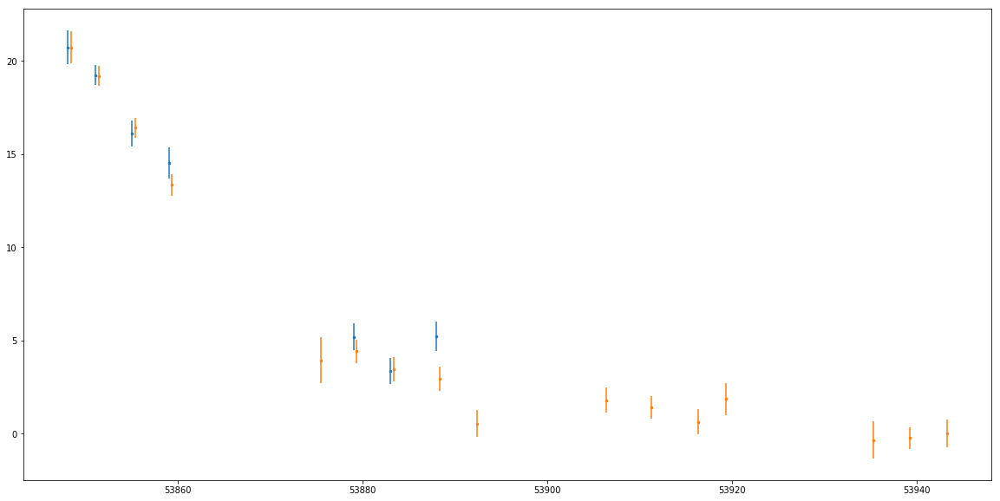

16
214.340266667 52.4528166667
     flux     
--------------
 4.49388933182
0.227312684059
 112.648712158
 101.170455933
 100.471725464
 89.7994918823
 28.2711963654
 24.6181278229
 12.9657211304
 15.3815660477
 8.90248012543
 7.13140535355
 10.6580495834
 6.51388931274
  9.3484954834
 5.56461238861


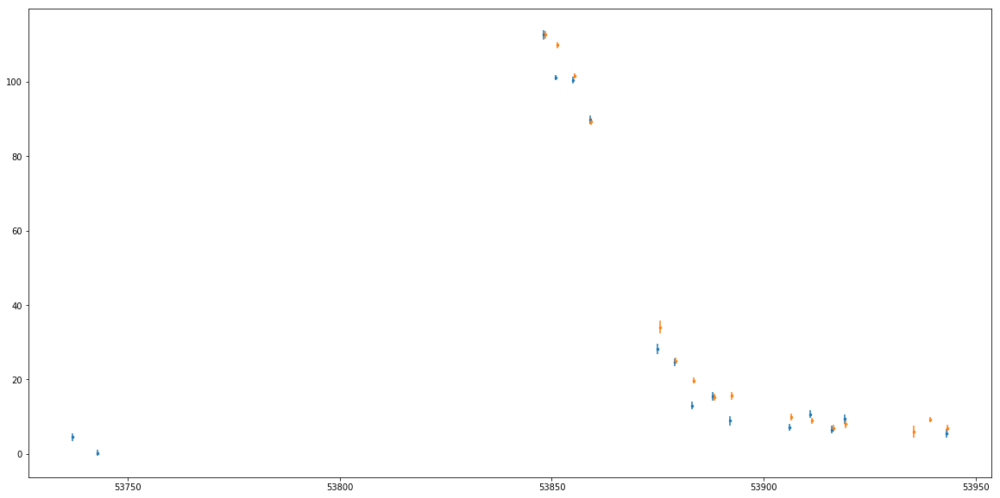

15
214.699175 52.7565583333
     flux    
-------------
4.72955608368
17.8758201599
71.5530014038
 76.886680603
  68.52684021
 54.860244751
51.4562797546
41.2991943359
14.6353025436
10.7054986954
9.03161334991
6.72396755219
5.39075660706
4.27998399734
 5.0445318222


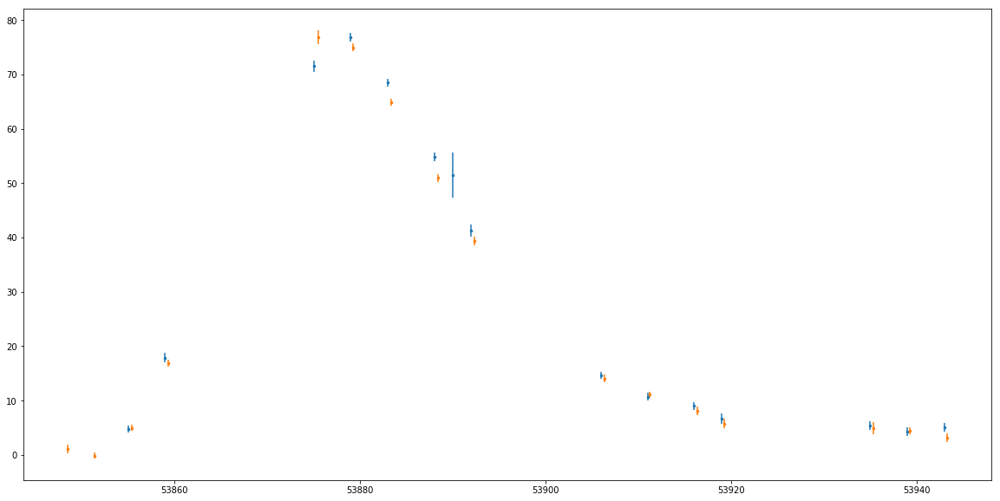

12
214.254529167 52.2324
     flux    
-------------
15.4342422485
 33.115524292
48.4454078674
64.8345184326
61.3112792969
66.6125640869
42.6255264282
36.5064086914
26.8384609222
22.3913879395
9.17623901367
5.35855293274


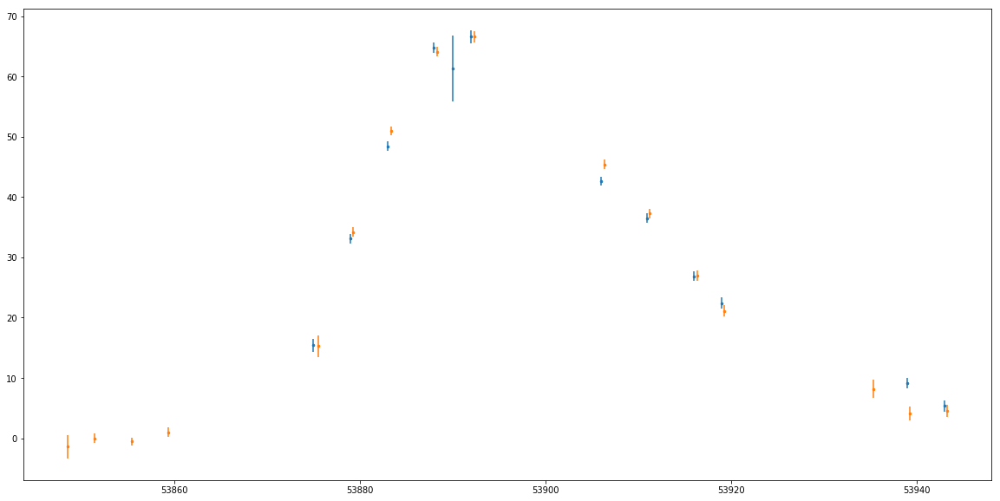

10
214.254529167 52.2324
flux
----
 nan
 nan
 nan
 nan
 nan
 nan
 nan
 nan
 nan
 nan


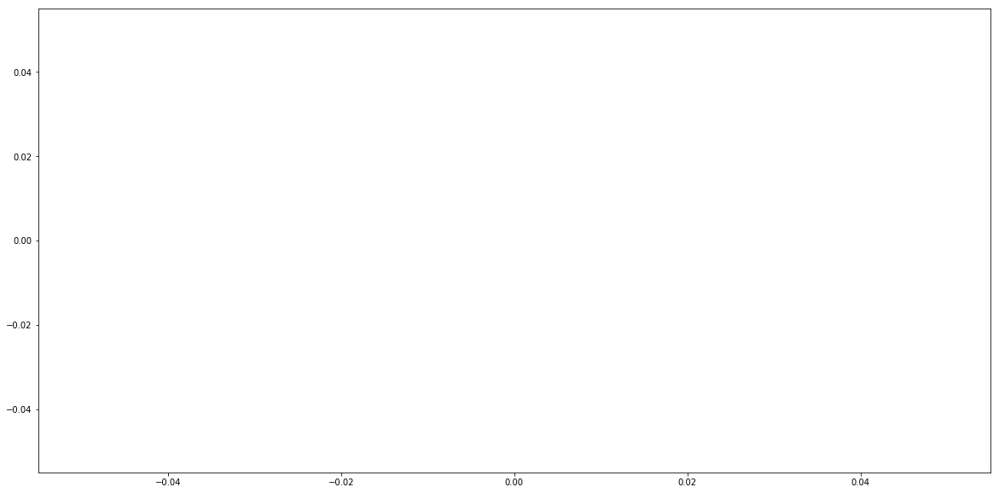

6
214.847579167 53.0230138889
     flux    
-------------
12.4889631271
12.9820404053
12.6513795853
 8.6551399231
9.60210609436
 3.2508187294


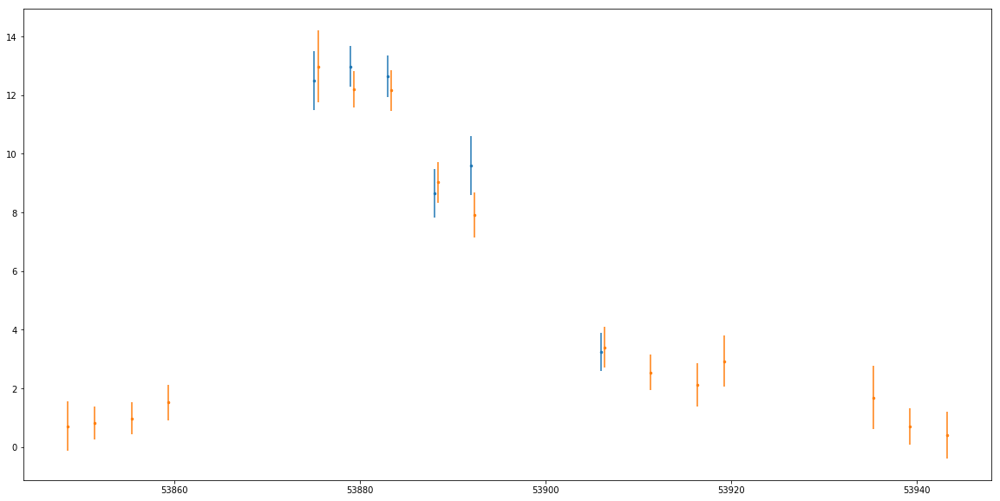

4
215.305566667 52.4560777778
     flux    
-------------
 6.1536192894
6.41705274582
4.60175657272
5.89700746536


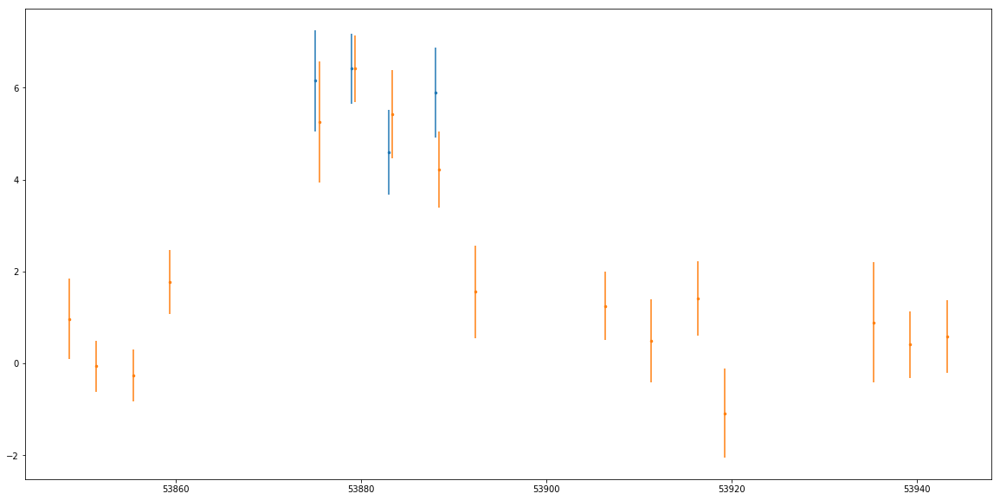

10
215.519875 52.3383666667
     flux     
--------------
-1.03138720989
 12.5224542618
 23.2113304138
 35.5039520264
    27.7766819
 37.7199516296
 22.5562858582
 14.8180875778
 9.34440994263
 7.53531646729


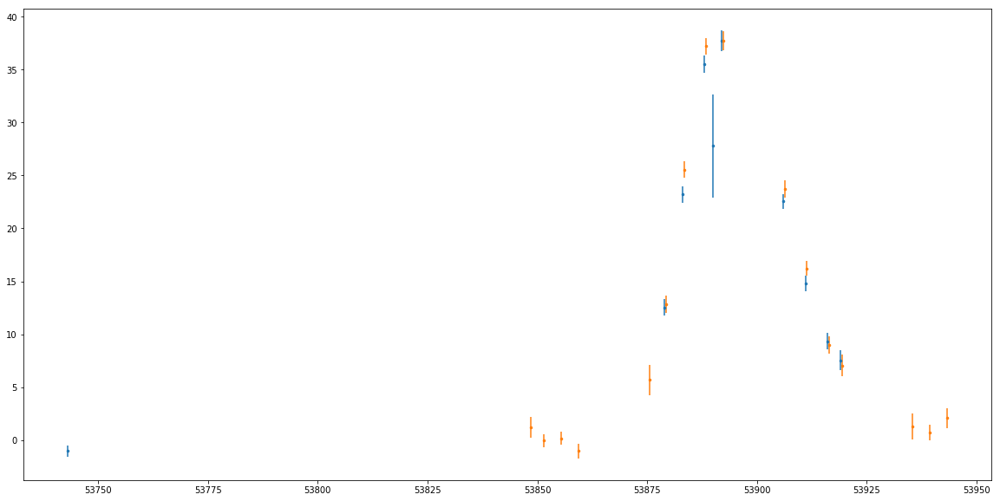

9
215.077520833 52.8971638889
     flux    
-------------
5.25718355179
26.4352302551
41.8788375854
64.1507263184
155.868041992
148.131195068
108.338844299
37.1133842468
23.5160121918


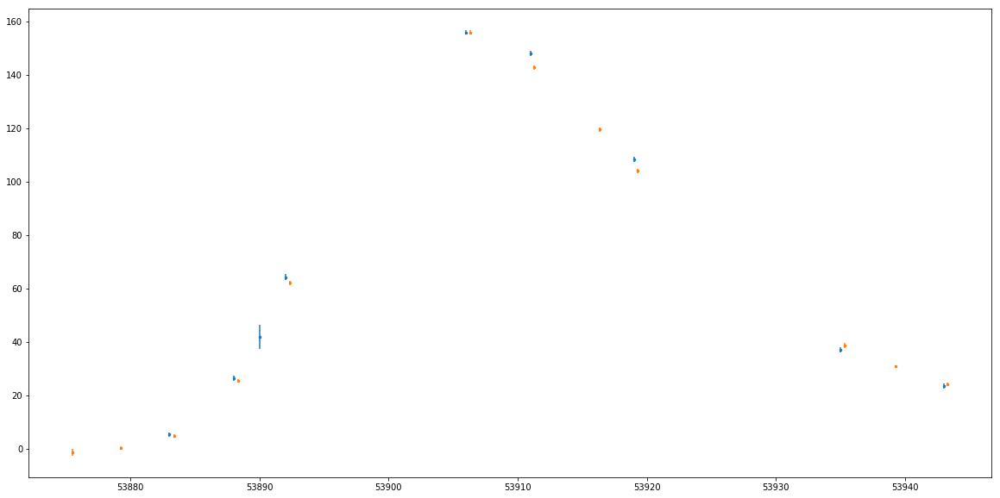

7
214.6309125 52.4429083333
     flux    
-------------
10.1911859512
 16.555557251
19.8912200928
21.5039367676
12.9876356125
 9.7098865509
6.39734268188


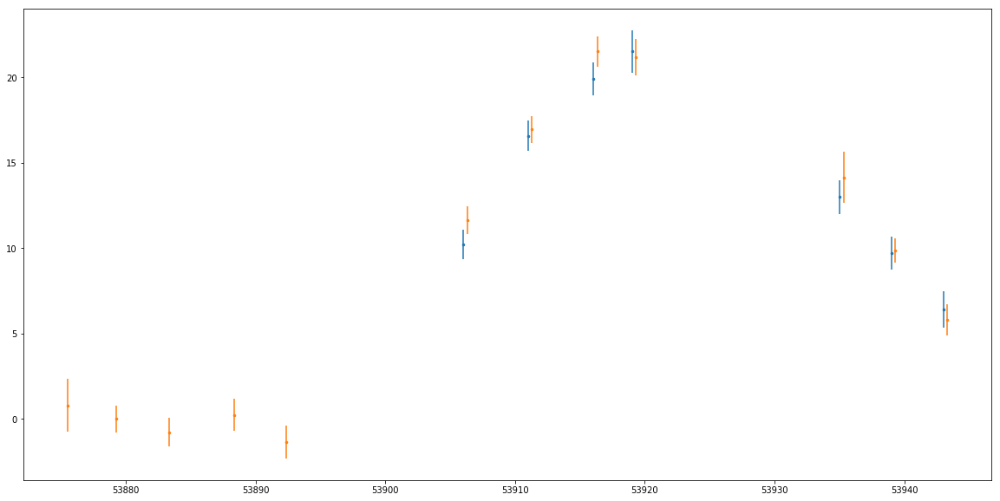

6
214.435958333 52.3611805556
     flux    
-------------
33.1351890564
80.8556671143
119.299499512
135.080566406
87.4461212158
56.9300880432


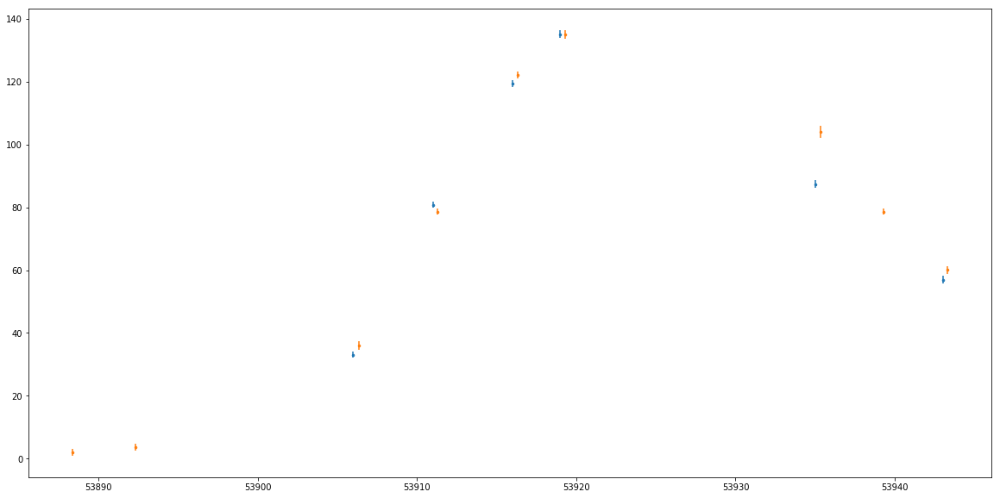

6
214.263475 52.9362527778
     flux     
--------------
-17.6153888702
  8.9858455658
 15.0051803589
 19.5374488831
 17.5779342651
 12.1284770966


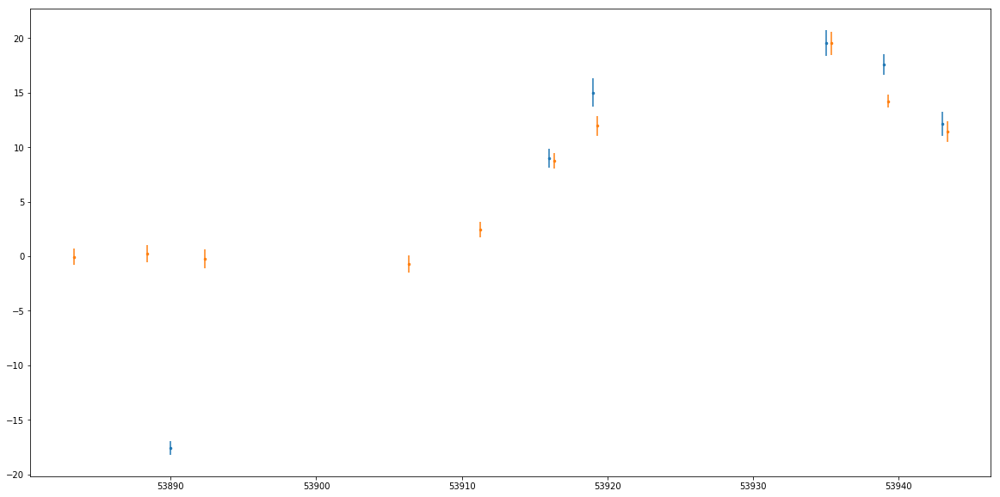

In [81]:
show_matches_2(matches_45)